## Import all modules and libraries

In [1]:
pip install opendatasets --upgrade

Note: you may need to restart the kernel to use updated packages.


In [2]:
import opendatasets as od


In [3]:
dataset_url = 'https://www.kaggle.com/datasets/preetviradiya/brian-tumor-dataset?resource=download'

od.download(dataset_url)

Skipping, found downloaded files in "./brian-tumor-dataset" (use force=True to force download)


In [4]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import copy
import os
import cv2

In [6]:
!pip install split-folders
!pip install torch-summary
!pip install torch

In [28]:
import splitfolders
from torchsummary import summary
import torch.nn.functional as F
from pathlib import Path
from sklearn.metrics import confusion_matrix, classification_report
import itertools 
from tqdm.notebook import trange, tqdm 
from torch import optim
import warnings
warnings.filterwarnings('ignore')

In [8]:
import torch
from PIL import Image 
from torch.utils.data import Dataset 
import torchvision
import torchvision.transforms as transforms 
from torch.utils.data import random_split 
from torch.optim.lr_scheduler import ReduceLROnPlateau 
import torch.nn as nn 
from torchvision import utils 
from torchvision.datasets import ImageFolder
import glob as gb

## Prepare the Data from path

In [9]:
summary_df = pd.read_csv('../Capstone 3 Brain Tumor Detection/brian-tumor-dataset/metadata.csv')

In [10]:
summary_df.head()

,Unnamed: 0,image,class,format,mode,shape
0,0,Cancer (1).jpg,tumor,JPEG,RGB,"(512, 512, 3)"
1,1,Cancer (1).png,tumor,PNG,L,"(300, 240)"
2,2,Cancer (1).tif,tumor,TIFF,RGB,"(256, 256, 3)"
3,3,Cancer (10).jpg,tumor,JPEG,RGB,"(512, 512, 3)"
4,4,Cancer (10).tif,tumor,TIFF,RGB,"(256, 256, 3)"


## Initial Data Analysis and Data Cleaning

In [11]:
summary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4600 entries, 0 to 4599
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  4600 non-null   int64 
 1   image       4600 non-null   object
 2   class       4600 non-null   object
 3   format      4600 non-null   object
 4   mode        4600 non-null   object
 5   shape       4600 non-null   object
dtypes: int64(1), object(5)
memory usage: 215.8+ KB


In [12]:
summary_df.isna().sum()

Unnamed: 0    0
image         0
class         0
format        0
mode          0
shape         0
dtype: int64

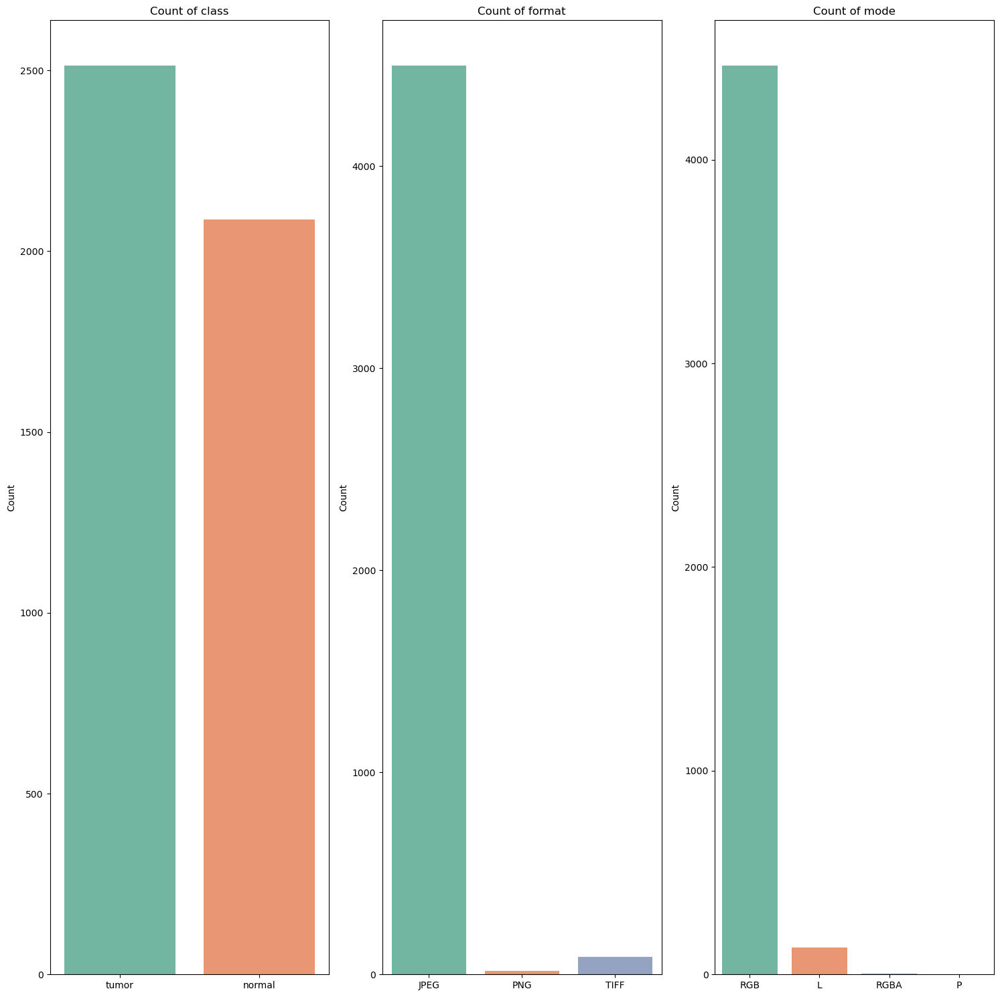

In [13]:
data_columns = summary_df.drop(columns=['Unnamed: 0', 'image', 'shape']).columns

plt.figure(figsize=(20,15))
for i, column in enumerate(data_columns, 1):
    plt.subplot(len(data_columns) // 4 + 1, 4, i)
    sns.countplot(x=column, data=summary_df, palette='Set2')
    plt.title(f'Count of {column}')
    plt.xlabel('')
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

In [14]:
summary_df['class'].value_counts()

class
tumor     2513
normal    2087
Name: count, dtype: int64

## Read Image Data and Segment them into Healthy and Tumorous 

In [15]:
code={'Brain Tumor':0,'Healthy':1}
def getname(n):
    for k,v in code.items():
        if v==n:
            return k

In [22]:
os.listdir('/Users/alexyeo/Desktop/Project 2/Capstone 3 Brain Tumor Detection/brian-tumor-dataset/Brain Tumor Data Set/Brain Tumor Data Set')

['Healthy', 'Brain Tumor']

In [26]:
data_dir = '/Users/alexyeo/Desktop/Project 2/Capstone 3 Brain Tumor Detection/brian-tumor-dataset/Brain Tumor Data Set/Brain Tumor Data Set'

In [29]:
data_dir = Path(data_dir)

In [35]:
data_dir = Path(data_dir)  # ensure it's a Path object
img1 = []

for folder in os.listdir(data_dir):
    folder_path = data_dir / folder
    images = gb.glob(str(folder_path / '*.jpg'))  # glob requires string input
    for img in images:
        img = cv2.imread(img, 0)
        img1.append(img)

In [36]:
pd.Series(img01).value_counts()

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [39]:
data_dir = Path(data_dir)  # Make sure this is a Path object
X = []
y = []

for folder in os.listdir(data_dir):
    folder_path = data_dir / folder
    images = gb.glob(str(folder_path / '*.jpg'))  # Convert Path to str for glob
    for img_path in images:
        img = cv2.imread(img_path, 0)  # Read in grayscale
        if img is None:
            print(f"Warning: Could not read image {img_path}")
            continue
        img2 = cv2.resize(img, (225, 255))
        X.append(img2)
        y.append(code[folder])
    print(f"For training data, found {len(images)} in folder '{folder}'")

For training data, found 2074 in folder 'Healthy'
For training data, found 2358 in folder 'Brain Tumor'


In [40]:
y=np.array(y)

## Analyze images in gray format 

In [41]:
def plot(img):
    plt.figure(figsize=(20,20))
    for i,v in enumerate(np.random.randint(0,len(img),36)):
        plt.subplot(6,6,i+1)
        plt.imshow(img[i],cmap='gray')
        plt.title(getname(y[v]))
        plt.axis('off')

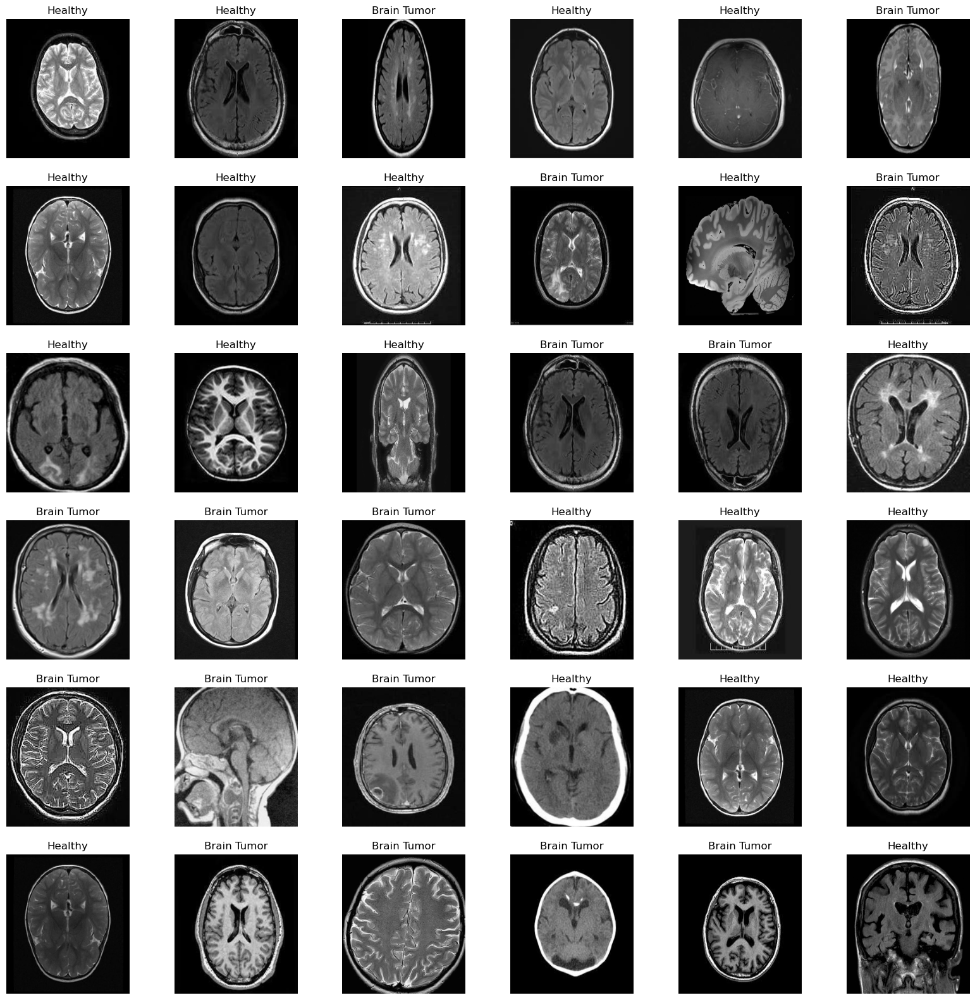

In [42]:
plot(X)

## Plot and analyze images in Histogram

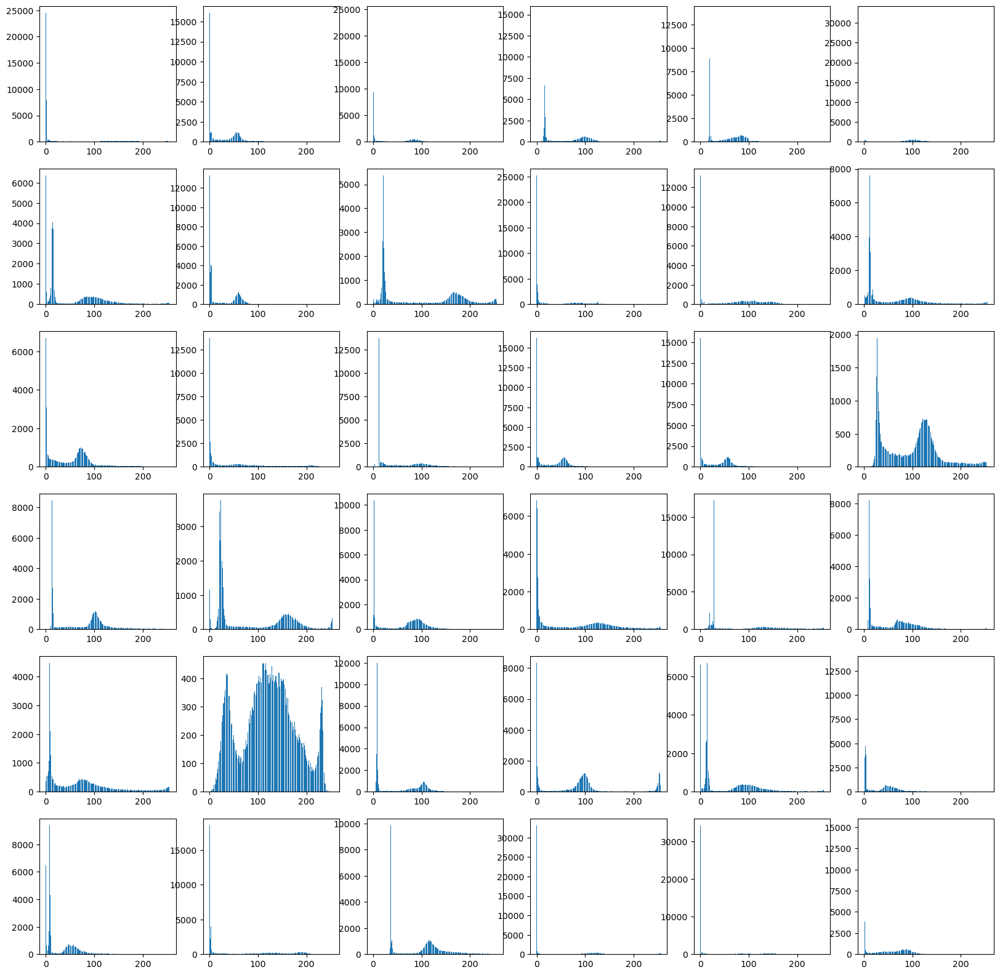

In [43]:
plt.figure(figsize=(20,20))
for i in range(len(np.random.randint(0,len(X),36))):
    plt.subplot(6,6,i+1)
    hist,bins=np.histogram(X[i].flatten(),bins=256,range=[0,255])
    plt.bar(x=range(256),height=hist);

## Analyze Images via Contrast Limited Adaptive Histogram Equalization (CLAHE)

After analyzing images using the Histogram data output, the images were evaluate through this method to improve conraat in images and reduce as much noise as possible. 

In [44]:
def hist(img):
    X_hist=[]
    for i in X:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))
        img_clahe = clahe.apply(i)
        X_hist.append(img_clahe)
    return X_hist

In [45]:
X_hist=hist(X)

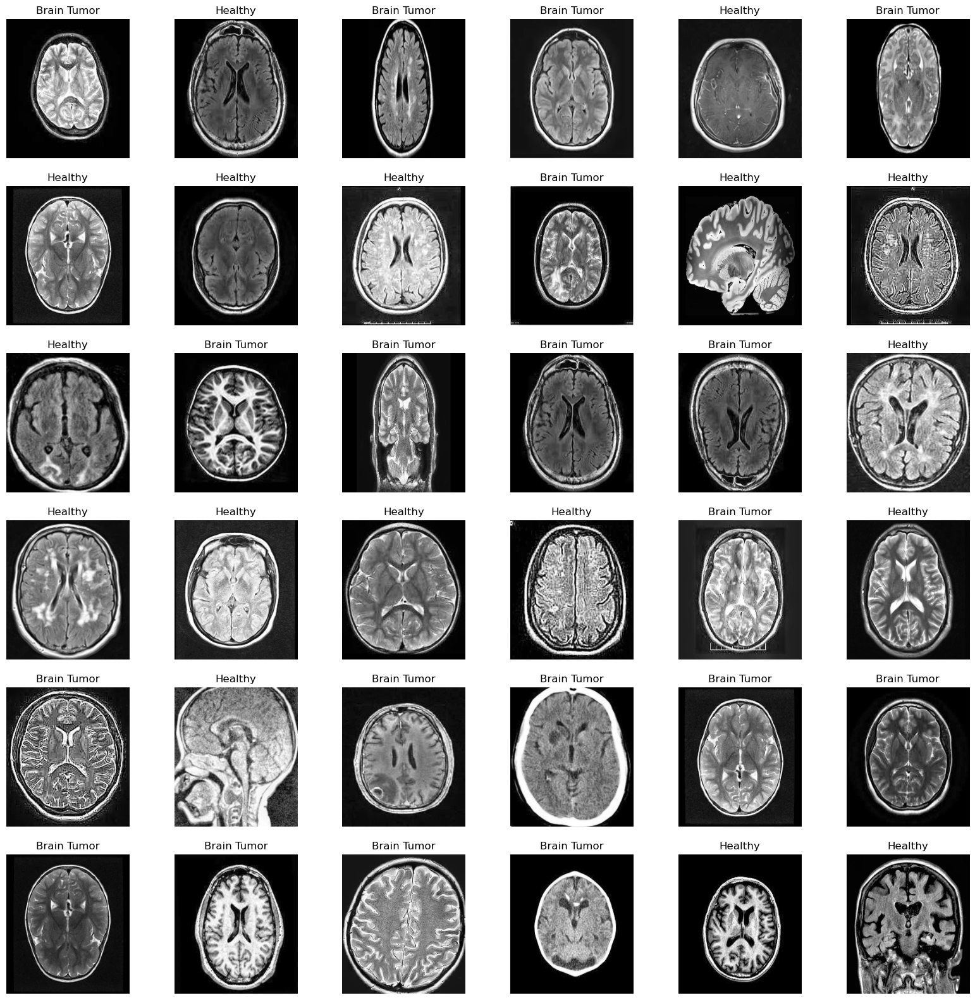

In [46]:
plot(X_hist)

## Analyze Images via Binarization

Binarization was evaluated to convert gray scale images into a binary image (back and/or white. However, using Binarization generated noisy images. 

In [47]:
def Binarization(img):
    Bin=[]
    for i in X:
        normalized_image = cv2.normalize(i, None, 0, 150, cv2.NORM_MINMAX)
        Bin.append(normalized_image)
    return Bin

In [48]:
X_Binar=Binarization(X)

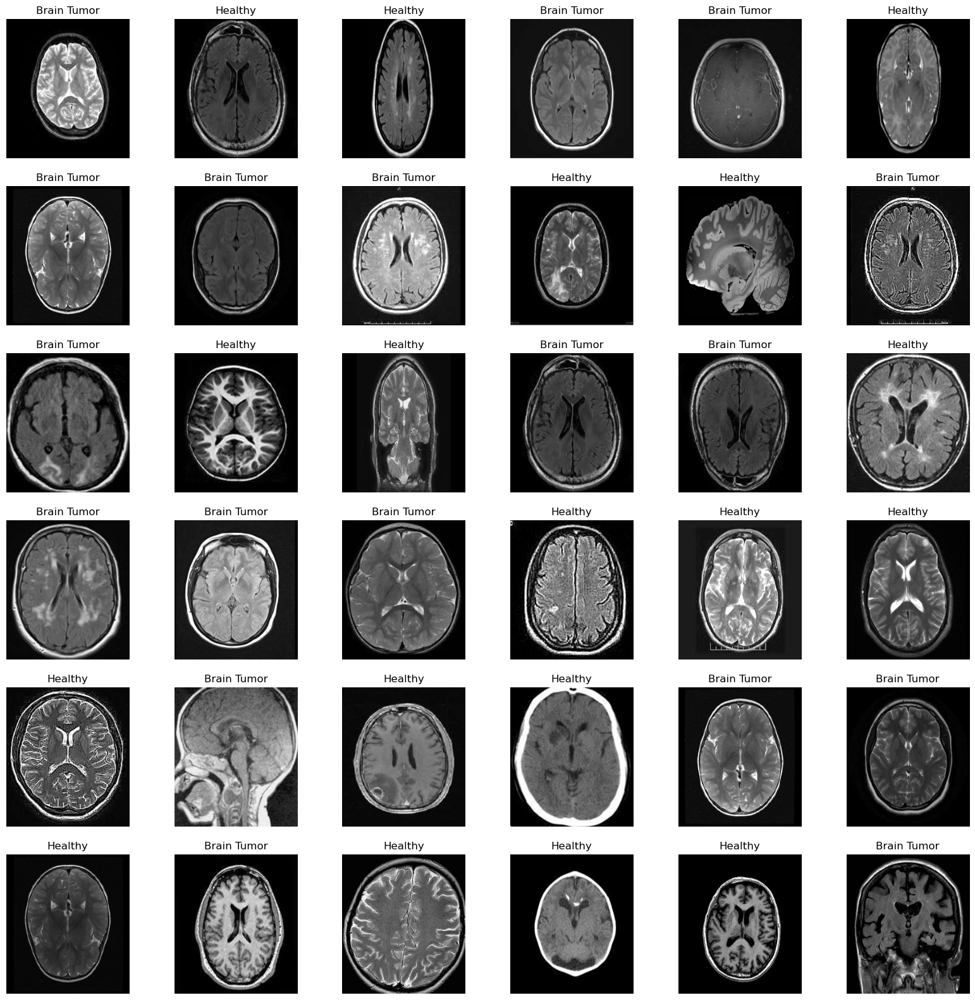

In [49]:
plot(X_Binar)

## Removing Noise

In [50]:
def remove_noise(img):
    img_median=[]
    for i in img:
        blur_img=cv2.GaussianBlur(i,(5,5),0)
        img_median.append(blur_img)
    return img_median

In [51]:
X_after_removen=remove_noise(X_hist)

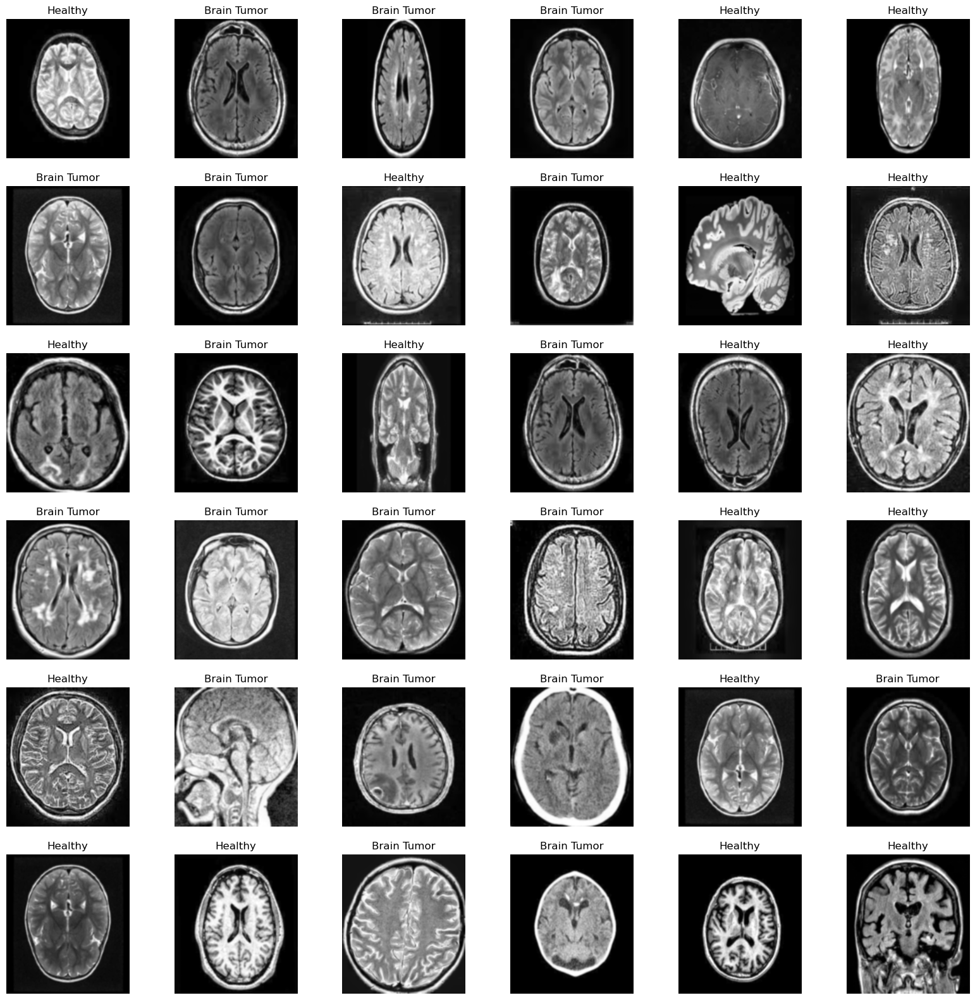

In [52]:
plot(X_after_removen)


## Edge Detection


In [53]:
def lap(img):
    img_thr=[]
    for i in img:
        laplace_img=cv2.Laplacian(i,cv2.CV_64F)
        img_thr.append(laplace_img)
    return img_thr

In [54]:
 x_see=lap(X_after_removen)

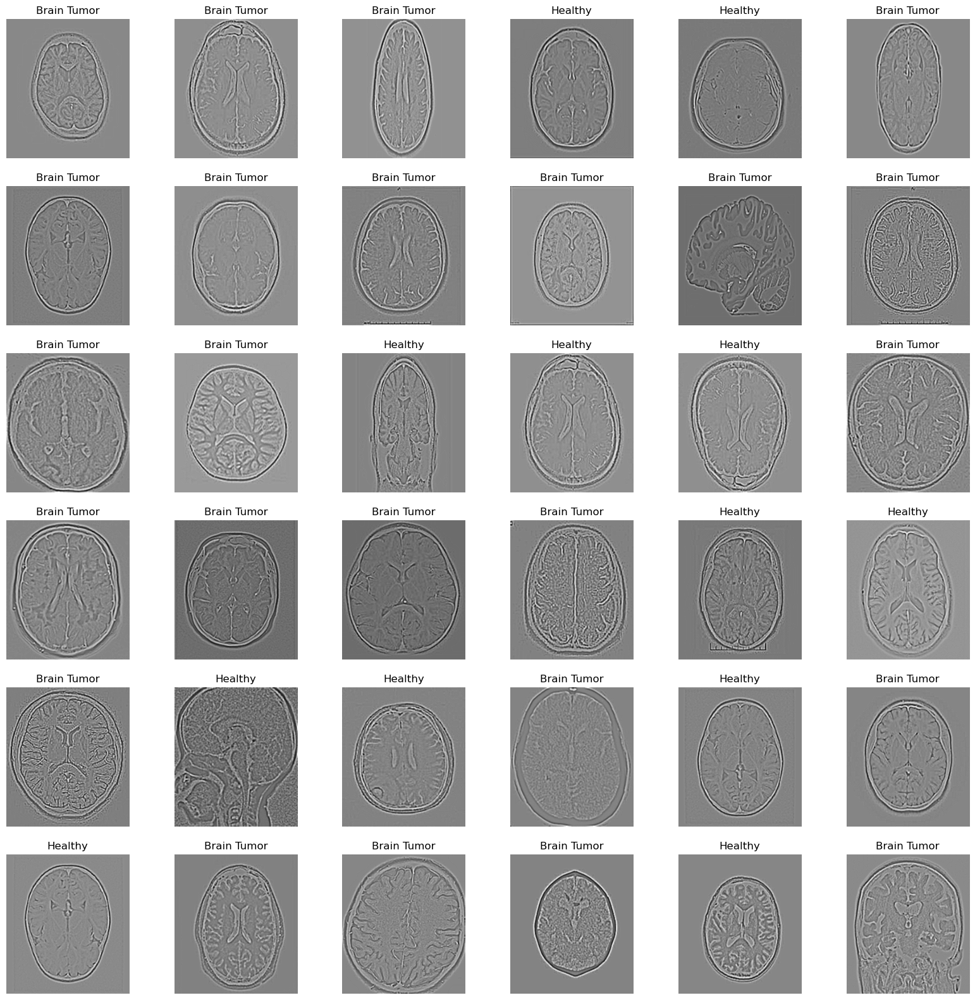

In [55]:
plot(x_see)